# EchoSpike Predictive Plasticity

In [5]:
import matplotlib.pyplot as plt
import os
from utils import  get_accuracy, get_samples, train_out_proj_fast, train_out_proj_closed_form
from main import Args
from data import load_SHD
from model import EchoSpike, simple_out
import numpy as np
from data import augment_shd
import torch
import seaborn as sns
from scipy.signal import savgol_filter
from tqdm.notebook import trange
from matplotlib import pyplot
pyplot.rcParams['figure.dpi'] = 600
plt.rcParams.update({'font.size': 18})
import pickle
torch.manual_seed(0)
color_list = sns.color_palette('muted')
device = 'cpu'
batch_size = 128
folder = 'models/'
model_name = 'shd_1layer_large.pt'
with open(folder + model_name[:-3] + '_args.pkl', 'rb') as f:
    args = pickle.load(f)
# args = Args()
online = args.online
print(vars(args))

{'model_name': 'shd_1layer_large', 'dataset': 'shd', 'online': True, 'device': 'cuda', 'recurrency_type': 'none', 'lr': 0.0001, 'epochs': 1000, 'augment': True, 'batch_size': 128, 'n_hidden': [1332], 'inp_thr': 0.05, 'c_y': [1.5, -1.5], 'n_inputs': 700, 'n_outputs': 20, 'n_time_bins': 100, 'beta': 0.95}


## Dataset
Spiking Heidelberg Digits

/home/lars/ownCloud/ETH/Master/Project_2/SNN_CLAPP/data.py:28: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.y = torch.tensor(y)


torch.Size([100, 1, 700]) tensor([4.])


(-0.5, 99.5, 699.5, -0.5)

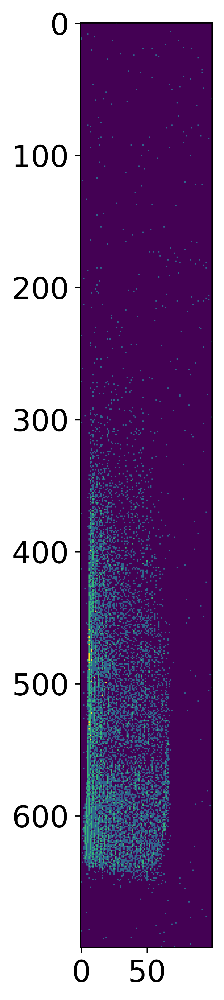

In [3]:
#train_loader, test_loader = load_PMNIST(n_time_bins, scale=0.9, patches=True) #load_NMNIST(n_time_bins, batch_size=batch_size)
n_time_bins = 100
train_loader, test_loader = load_SHD(batch_size=batch_size) #load_NMNIST(n_time_bins, batch_size=batch_size)
# Plot Example(s)
for i in range(1):
    frames, target = train_loader.next_item(-1, contrastive=True)
    plt.figure(figsize=(10, 10))
    plt.axis('off')
    plt.imshow(frames.squeeze(1).T)
    # plt.colorbar()
    print(frames.shape, target)
plt.axis('on')

## Load pretrained model

torch.Size([63719, 1])


Text(0, 0.5, 'EchoSpike Loss')

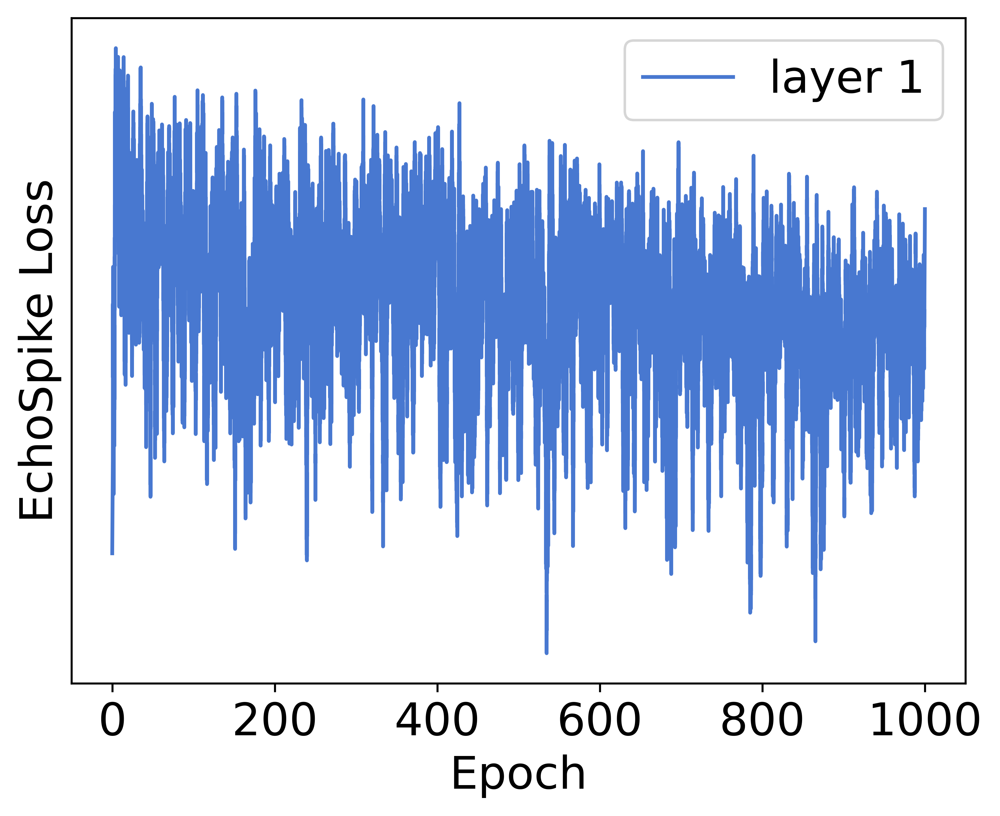

In [4]:
SNN = EchoSpike(args.n_inputs, args.n_hidden, beta=args.beta, c_y=args.c_y, device=device, recurrency_type=args.recurrency_type, online=args.online).to(device)
SNN.load_state_dict(torch.load(folder+model_name, map_location=device))
# train(SNN, train_loader, args.epochs, device, args.model_name,
                            # batch_size=args.batch_size, online=args.online, lr=1e-8, augment=args.augment)
from_epoch = 0
echo_train_loss = torch.load(folder+model_name[:-3]+'_loss_hist.pt', map_location='cpu')[int(from_epoch*len(train_loader)/args.batch_size):]
print(echo_train_loss.shape)
for i in range(echo_train_loss.shape[-1]):
    plt.plot(from_epoch+(args.batch_size*np.arange(echo_train_loss.shape[0])/len(train_loader)), savgol_filter(echo_train_loss[:,i], 99, 1), color=color_list[i])
plt.legend([f'layer {i+1}' for i in range(len(SNN.layers))])
# no y ticks, because it's not really meaningful
plt.yticks([])
plt.xlabel('Epoch')
plt.ylabel('EchoSpike Loss')

tensor([9.]) tensor([7.]) tensor([7.])


IndexError: index 3 is out of bounds for dimension 0 with size 1

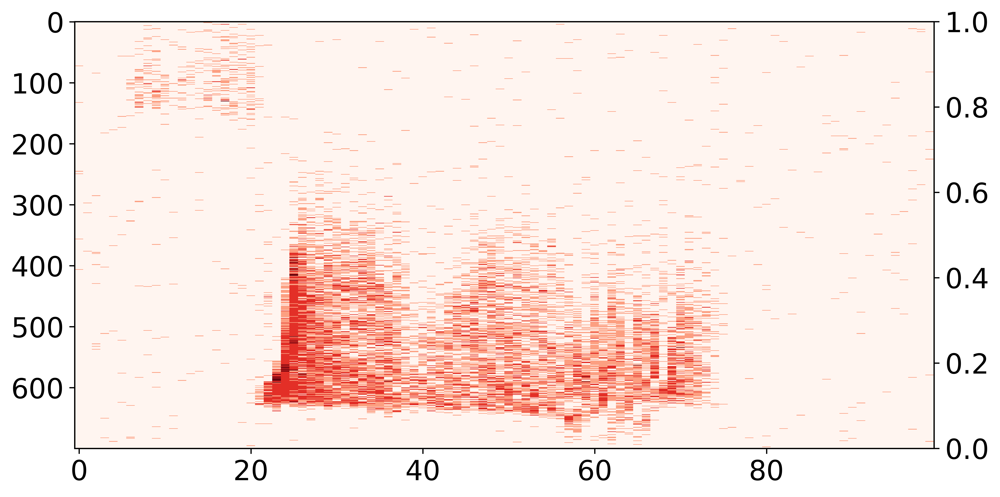

In [4]:
# plotting adaptive threshold and update rate for an example
while True:
    init_echo, label_0 = train_loader.next_item(-1, contrastive=True)
    sample_1, label_1 = train_loader.next_item(-1, contrastive=True)
    sample_2, label_2 = train_loader.next_item(label_1, contrastive=False)
    if label_0 == 9 and label_1 == 7:
        break
print(label_0, label_1, label_2)
SNN.eval()
with torch.no_grad():
    # feed first sample to get initial activity
    for t in range(100):
        inp_activity = init_echo[t].mean(axis=-1)
        SNN(init_echo[t], torch.tensor(-1, device=device), inp_activity=inp_activity)
    SNN.reset(-1)
    # feed second sample to get the update rates and thresholds for contrastive case
    contrastive_thresholds = torch.zeros(100)
    contrastive_temp_sim = torch.zeros((len(SNN.layers), 100))
    for t in range(100):
        inp_activity = sample_1[t].mean(axis=-1)
        out_spk, mems, losses = SNN(sample_1[t], torch.tensor(-1, device=device), inp_activity=inp_activity)
        contrastive_thresholds[t] = inp_activity * args.c_y[1]
        contrastive_temp_sim[:, t] = losses
    SNN.reset(-1)
    # feed third sample to get the update rates and thresholds for predictive case
    predictive_thresholds = torch.zeros(100)
    predictive_temp_sim = torch.zeros((len(SNN.layers), 100))
    for t in range(100):
        inp_activity = sample_2[t].mean(axis=-1)
        out_spk, mems, losses = SNN(sample_1[t], torch.tensor(1, device=device), inp_activity=inp_activity)
        predictive_thresholds[t] = inp_activity * args.c_y[0]
        predictive_temp_sim[:, t] = -losses
    SNN.reset(1)
    # plot thresholds, with sample as background
    layer = 3
    fig, ax = plt.subplots(figsize=(10, 5))
    ax2  = ax.twinx()
    # imshow in background
    ax.imshow(sample_1.squeeze(1).T, aspect='auto', cmap='Reds')
    ax2.plot(-contrastive_temp_sim[layer], color='r', label='Negative Similarity Score')
    ax2.plot(contrastive_thresholds, color='r', linestyle='--', label='Adaptive Threshold')
    ax2.hlines(args.inp_thr*args.c_y[1], 0, 100, color='r', linestyle=':', label='Input Threshold (times c(-1))')
    # highlight regions where the thresholds are crossed
    argwhere = np.argwhere(np.logical_and((-contrastive_temp_sim[layer] < contrastive_thresholds).numpy(), contrastive_thresholds.numpy() < args.inp_thr*args.c_y[1]))
    for i in range(argwhere.shape[0]):
        ax2.axvspan(argwhere[i], argwhere[i]+1, color='r', alpha=0.2, lw=0)

    ax.yaxis.set_visible(False)
    ax2.spines['right'].set_visible(False)
    ax2.yaxis.tick_left()
    ax2.yaxis.set_label_position('left')
    ax2.set_xlim(ax.get_xlim())
    # get rid of right margin
    ax2.margins(0)
    ax.set_xlabel('Timesteps')
    plt.ylabel('Thresholds & Similarity Score')
    plt.xlim(0, 100)
    plt.legend()
    # same for predictive
    fig, ax = plt.subplots(figsize=(10, 5))
    ax2  = ax.twinx()
    # imshow in background
    ax.imshow(sample_2.squeeze(1).T, aspect='auto', cmap='Blues')
    ax2.plot(predictive_temp_sim[layer], color='b', label='Similarity Score')
    ax2.plot(predictive_thresholds, color='b', linestyle='--', label='Adaptive Threshold')
    ax2.hlines(args.inp_thr*args.c_y[0], 0, 100, color='b', linestyle=':', label='Input Threshold (times c(1))')
    # highlight regions where the thresholds are crossed
    argwhere = np.argwhere(np.logical_and((predictive_temp_sim[layer] < predictive_thresholds).numpy(), predictive_thresholds.numpy() > args.inp_thr*args.c_y[0]))
    for i in range(argwhere.shape[0]):
        ax2.axvspan(argwhere[i], argwhere[i]+1, color='b', alpha=0.1, lw=0)
    ax.yaxis.set_visible(False)
    ax2.spines['right'].set_visible(False)
    ax2.yaxis.tick_left()
    ax2.yaxis.set_label_position('left')
    ax2.set_xlim(ax.get_xlim())
    # get rid of right margin
    #ax2.margins(0)
    ax.set_xlabel('Timesteps')
    plt.ylabel('Thresholds & Similarity Score')
    plt.xlim(0, 100)
    plt.legend()
    plt.show()

# Analyze Weights Directly

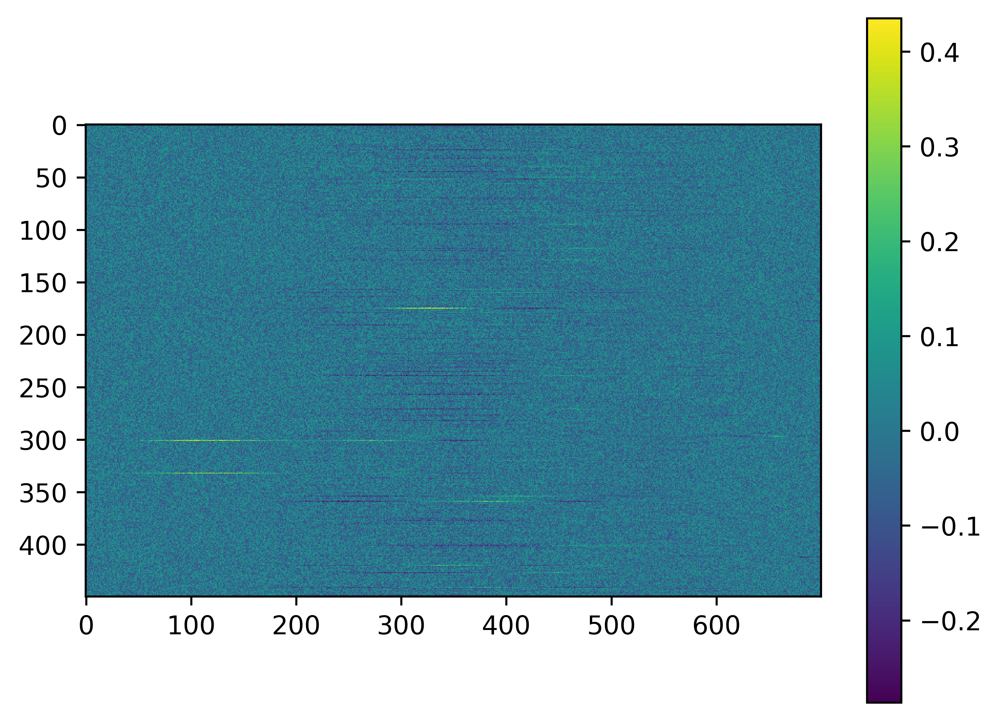

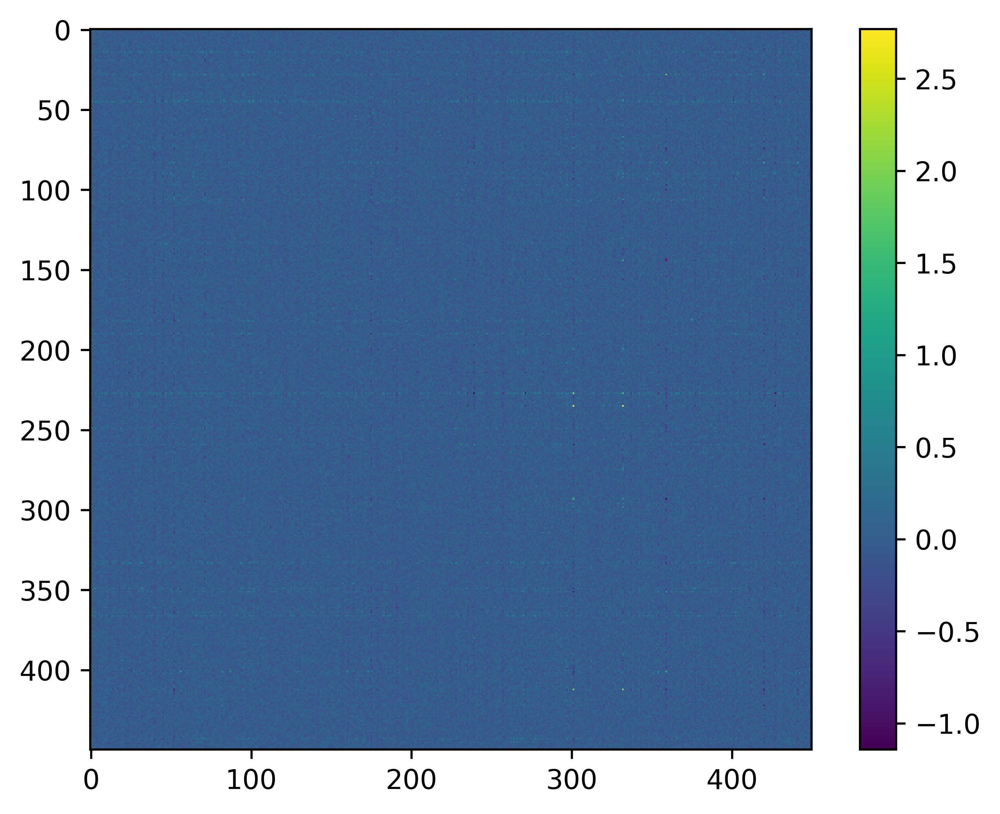

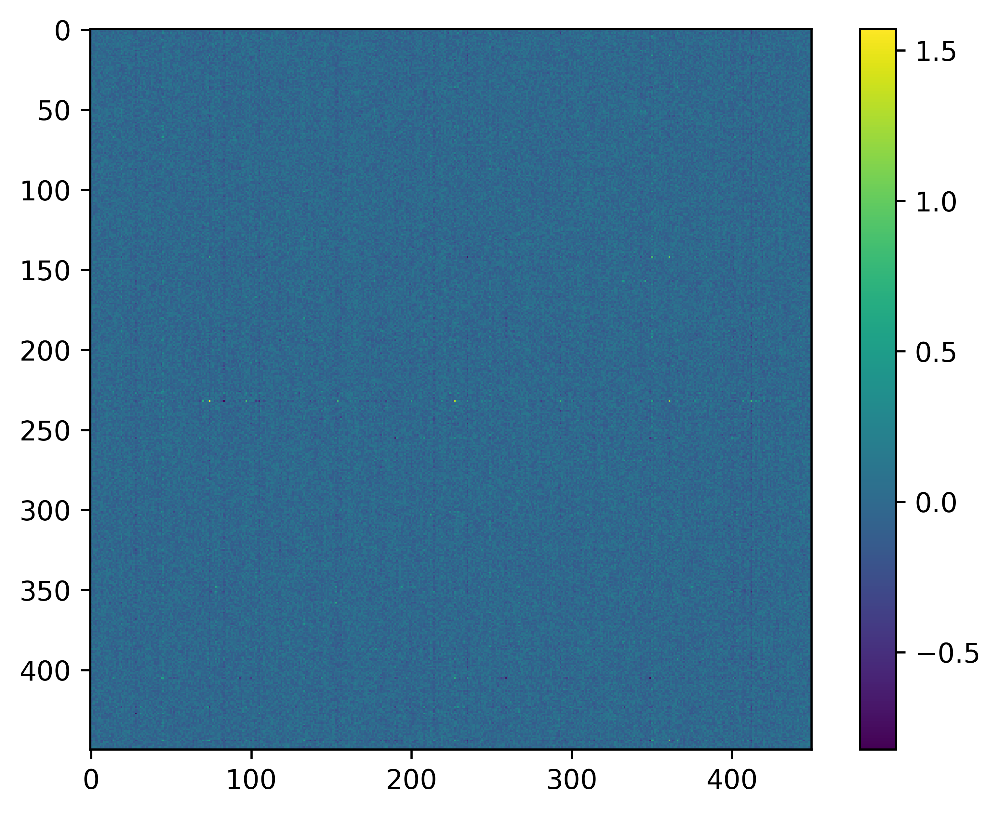

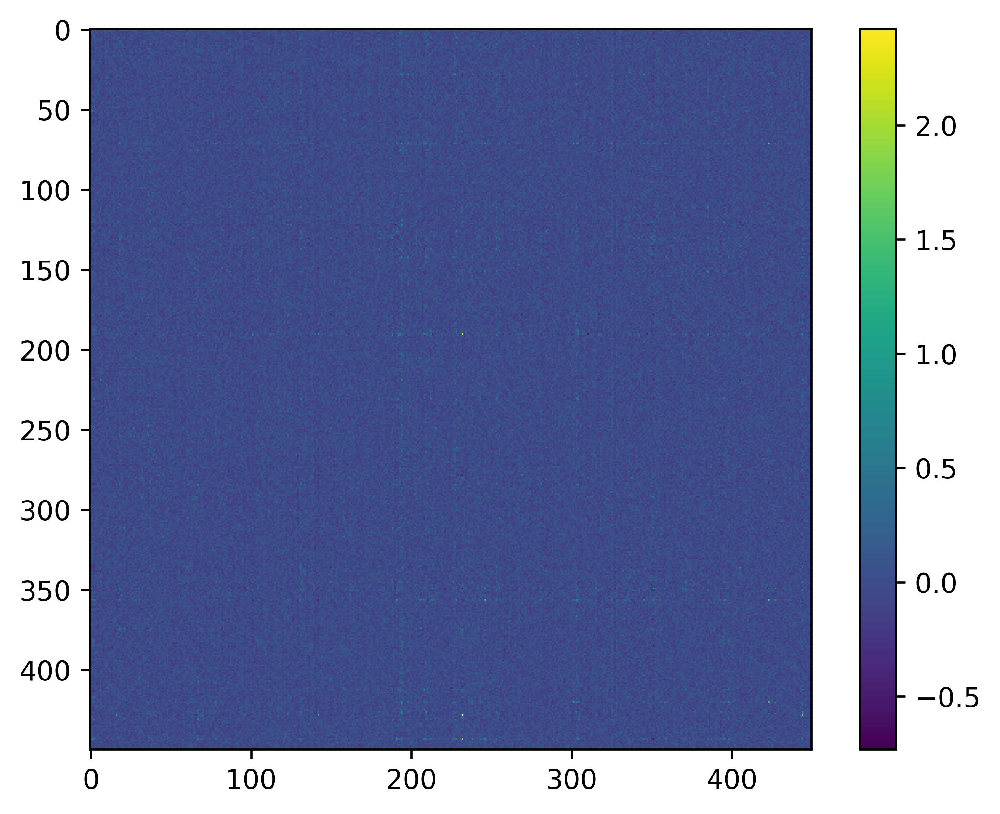

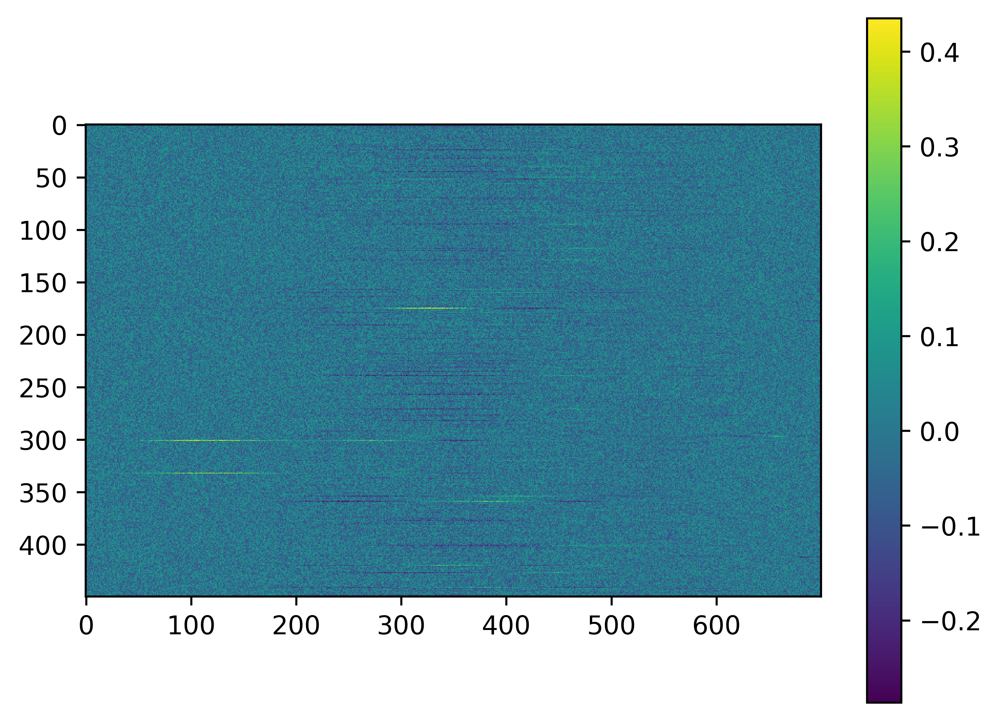

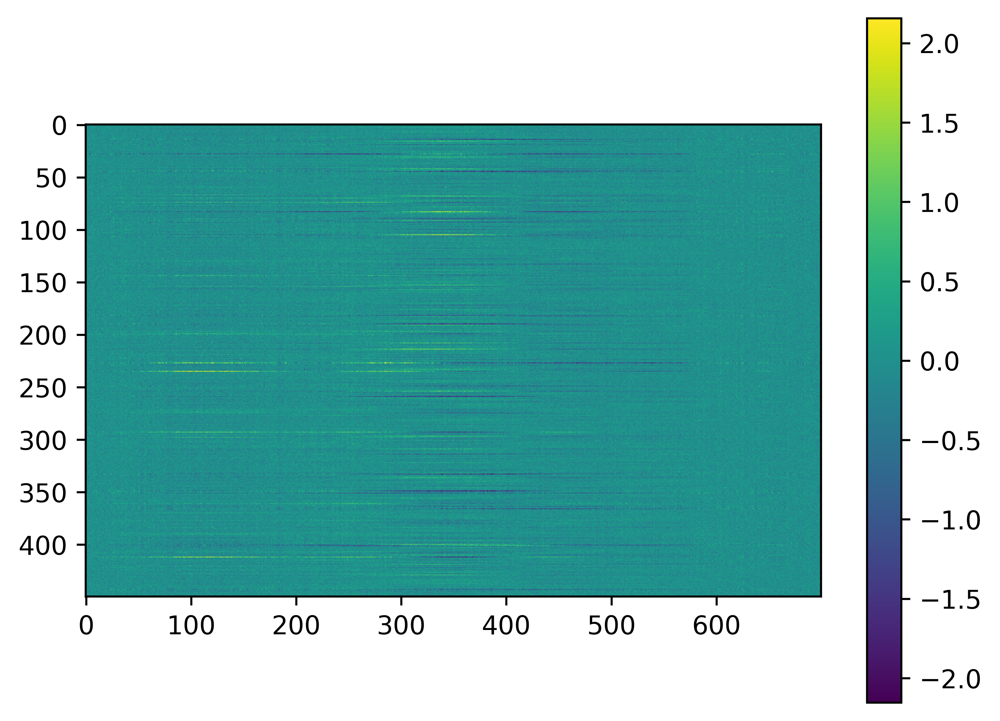

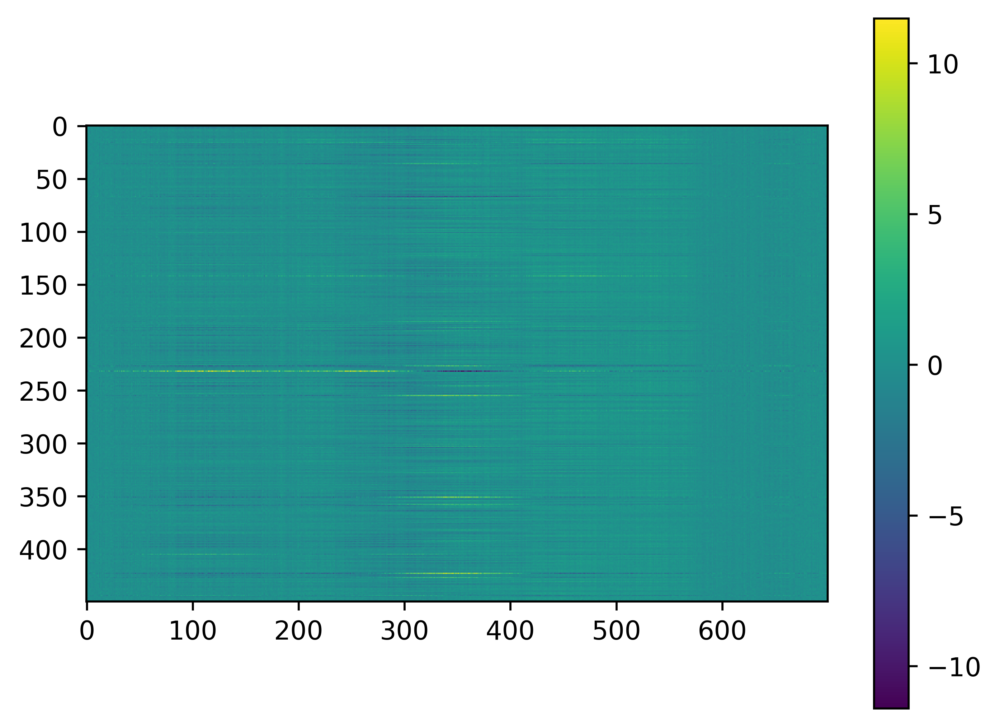

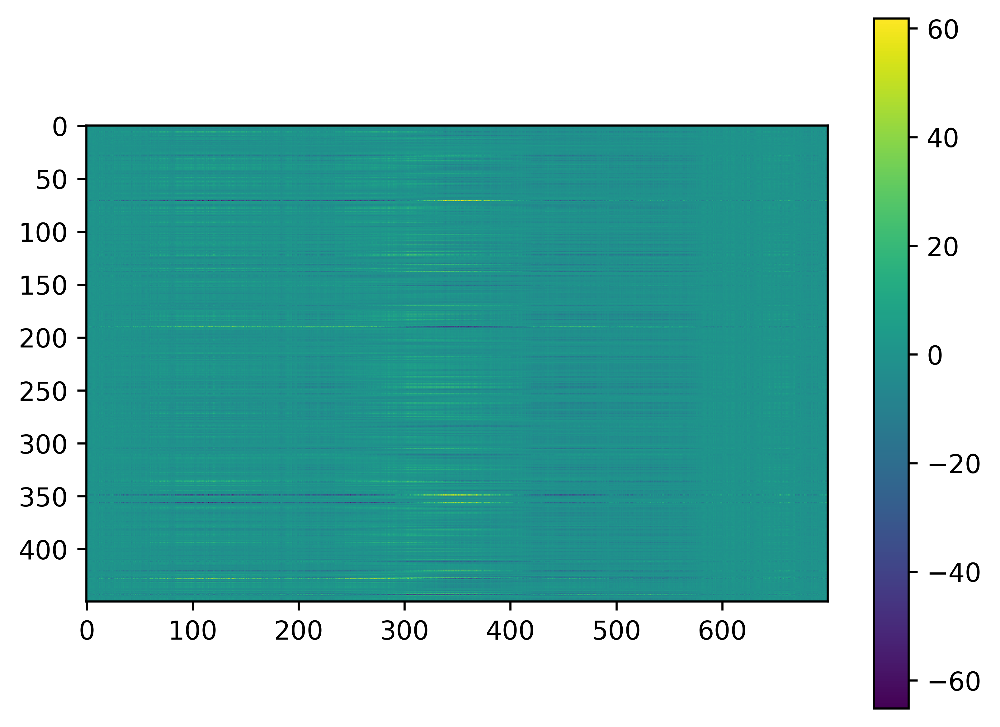

In [5]:
layers = [SNN.layers[0].fc.weight[:,:args.n_inputs]]
for i in range(1, len(SNN.layers)):
    layers.append(SNN.layers[i].fc.weight[:,:args.n_hidden[i-1]] @ layers[-1])

for i in range(len(SNN.layers)):
    plt.figure()
    plt.imshow(SNN.layers[i].fc.weight.detach(), cmap='viridis')
    plt.colorbar()
    # plt.figure()
    # plt.imshow(SNN.layers[i].pred.weight.detach(), vmax=0.5, vmin=-0.5)
    # plt.colorbar()
for lay in layers:
    plt.figure()
    plt.imshow(lay.detach())
    plt.colorbar()

# Train output Projection

In [7]:
from tqdm.notebook import tqdm
def train_out_proj(epochs, batch, cat, out_projs=None):
    # train output projections from all layers (and no layer)
    losses_out = []
    beta = 1.0
    lr = 1e-4
    augment = True
    optimizers = []
    print_interval = 10*batch
    if out_projs is None:
        out_projs = []
        out_proj_0 = simple_out(700, 20, beta=beta)
    else:
        for out_p in out_projs:
            out_p.train()
            out_p.reset()
        out_proj_0 = out_projs[0]
        out_projs = out_projs[1:]
    optim_0 = torch.optim.Adam(out_proj_0.parameters(), lr=lr)
    for lay in range(len(SNN.layers)):
        if len(out_projs) <= lay:
            if cat:
                out_projs.append(simple_out(sum(args.n_hidden[:lay+1])+700, 20, beta=beta))
            else:
                out_projs.append(simple_out(args.n_hidden[lay], 20, beta=beta))
        optimizers.append(torch.optim.Adam(out_projs[lay].parameters(), lr=lr))
        optimizers[-1].zero_grad()
    SNN.eval()
    acc = []
    target = batch_size*[-1]
    correct = (len(SNN.layers) + 1)*[0]
    with torch.no_grad():
        pbar = tqdm(total=len(train_loader)*epochs)
        while len(losses_out)*batch < len(train_loader)*epochs:
            data, target = train_loader.next_item(target, contrastive=True)
            SNN.reset(0)
            logit_lists = [[] for _ in range(len(SNN.layers)+1)]
            data = data.squeeze()
            if augment:
                data = augment_shd(data)
            for step in range(data.shape[0]):
                data_step = data[step].float().to(device)
                target = target.to(device)
                logits, _, _ = SNN(data_step, 0)
                if step == args.n_time_bins-1:
                    _, logts = out_proj_0(data_step, target)
                    logit_lists[0] = logts
                    for lay in range(len(SNN.layers)):
                        if cat:
                            data_step = torch.cat([data_step, logits[lay]], dim=-1)
                        else:
                            data_step = logits[lay]
                        _, logts = out_projs[lay](data_step, target)
                        logit_lists[lay+1] = logts
                else:
                    out_proj_0(data_step, None)
                    for lay in range(len(SNN.layers)):
                        if cat:
                            data_step = torch.cat([data_step, logits[lay]], dim=-1)
                        else:
                            data_step = logits[lay]
                        out_projs[lay](data_step, None)
            
            preds = [logit_lists[lay].argmax(axis=-1) for lay in range(len(SNN.layers)+1)]
            correct = [correct[lay] + (preds[lay] == target).sum() for lay in range(len(SNN.layers)+1)]
            out_proj_0.reset()
            for i, out_proj in enumerate(out_projs):
                out_proj.reset()

            losses_out.append(torch.tensor([torch.nn.functional.cross_entropy(logit_lists[lay], target.squeeze().long()) for lay in range(len(SNN.layers)+1)], requires_grad=False))

            optim_0.step()
            optim_0.zero_grad()
            for opt in optimizers:
                opt.step()
                opt.zero_grad()
            
            if len(losses_out)*batch % print_interval == 0:
                pbar.write(f'Cross Entropy Loss: {(torch.stack(losses_out)[-print_interval//batch:].sum(dim=0)/(print_interval//batch)).numpy()}\n' +
                           f'Correct: {100*np.array(correct)/print_interval}%')
                acc.append(np.array(correct)/print_interval)
                correct = (len(SNN.layers) + 1)*[0]
            pbar.update(batch)
    return [out_proj_0, *out_projs], np.asarray(acc), torch.stack(losses_out)

with torch.no_grad():
    if args.augment:
        n_epochs = 100
        cat = True
        # if already trained, load the output projections
        if os.path.exists(folder+model_name[:-3]+'_out_projs.pt') and False:
            out_projs = torch.load(folder+model_name[:-3]+'_out_projs.pt', map_location=device)
        else:
            out_projs, acc, losses_out = train_out_proj(n_epochs, batch_size, cat)
            test_acc = get_accuracy(SNN, out_projs, test_loader, device, cat, )
            train_acc = get_accuracy(SNN, out_projs, train_loader, device, cat)
            torch.save(out_projs, folder+model_name[:-3]+'_out_projs.pt')

  0%|          | 0/815600 [00:00<?, ?it/s]

Cross Entropy Loss: [14.313995  9.099342]
Correct: [5.625    5.859375]%
Cross Entropy Loss: [8.187934  6.3089476]
Correct: [4.921875 6.484375]%
Cross Entropy Loss: [6.951187 5.181357]
Correct: [ 4.53125  10.078125]%
Cross Entropy Loss: [5.946702 4.473062]
Correct: [ 7.890625 10.234375]%
Cross Entropy Loss: [5.4507284 3.974528 ]
Correct: [ 7.265625 13.046875]%
Cross Entropy Loss: [4.881641  3.6358018]
Correct: [ 8.828125 14.6875  ]%
Cross Entropy Loss: [4.61839   3.4733715]
Correct: [ 9.84375  18.203125]%
Cross Entropy Loss: [4.3676906 3.2100844]
Correct: [ 9.0625  17.03125]%
Cross Entropy Loss: [4.2846184 3.0249293]
Correct: [10.78125 23.28125]%
Cross Entropy Loss: [3.8945746 2.8896012]
Correct: [12.1875 23.125 ]%
Cross Entropy Loss: [3.820954  2.9955711]
Correct: [10.546875 23.59375 ]%
Cross Entropy Loss: [3.564299  2.6497583]
Correct: [13.75     24.765625]%
Cross Entropy Loss: [3.6856475 2.7007663]
Correct: [14.609375 23.203125]%
Cross Entropy Loss: [3.4151406 2.6983943]
Correct: [13

  0%|          | 0/36 [00:00<?, ?it/s]

Directly from inputs:
Accuracy: 46.95%
From layer 1:
Accuracy: 68.86%


  0%|          | 0/128 [00:00<?, ?it/s]

Directly from inputs:
Accuracy: 45.13%
From layer 1:
Accuracy: 78.47%


In [8]:
accs = {'train': train_acc, 'test': test_acc}
with open('final_results/' + model_name[:-3] + '_accuracies.pkl', 'wb') as f:
    pickle.dump(accs, f)

In [ ]:
if not args.augment:
    # if snn_samples already exist, don't recompute
    accs = {}
    try:
        snn_samples
    except:
        snn_samples, targets = get_samples(SNN, train_loader, args.n_hidden, device)
    for cat in [False, True]:
        test_accs = []
        train_accs = []
        for i in range(10):
            with torch.no_grad():
                out_projs, acc, losses_out = train_out_proj_fast(SNN, args, 30, 60, snn_samples, train_loader.y, cat=cat, lr=3e-4, weight_decay=0)
            print('Mean abs weights', out_projs[-1].out_proj.weight.abs().mean())
            test_accs.append(get_accuracy(SNN, out_projs, test_loader, device, cat=cat)[0])
            train_accs.append(get_accuracy(SNN, out_projs, train_loader, device, cat=cat)[0])
        test_accs = torch.stack([torch.tensor(ta) for ta in test_accs])
        train_accs = torch.stack([torch.tensor(ta) for ta in train_accs])
        print(f'Fast Classifier Mean Test Accuracy: {100*torch.mean(test_accs, dim=0)}, Std: {100*torch.std(test_accs, dim=0)}')
        print(f'Fast Classifier Mean Train Accuracy: {100*torch.mean(train_accs, dim=0)}, Std: {100*torch.std(train_accs, dim=0)}')
        if cat:
            accs['train_cat'] = train_accs
            accs['test_cat'] = test_accs
        else:
            accs['train'] = train_accs
            accs['test'] = test_accs
    with open('final_results/' + model_name[:-3] + '_accuracies.pkl', 'wb') as f:
        pickle.dump(accs, f)

In [ ]:
# run all checkpoints
if not args.augment: 
    last_ckp = 20
    test_accs_ckpt = []
    train_accs_ckpt = []
    epochs = []
    while True:
        print(f'Checkpoint {last_ckp}')
        SNN_ckp = EchoSpike(args.n_inputs, args.n_hidden, beta=args.beta, device=device, recurrency_type=args.recurrency_type, online=args.online).to(device)
        try:
            print(model_name[:-3] + f'_epoch{last_ckp}.pt')
            state_dict = torch.load(folder+model_name[:-3] + f'_epoch{last_ckp}.pt', map_location=device)
            # state_dict = {key.replace('clapp', 'layers'):value for key, value in state_dict.items()}
            # torch.save(state_dict, folder+model_name + f'_epoch{last_ckp}.pt')
            SNN_ckp.load_state_dict(state_dict)
        except:
            if last_ckp > 1500:
                break
            else:
                last_ckp += 20
                continue
        epochs.append(last_ckp)
        last_ckp += 20
        snn_samples, targets = get_samples(SNN_ckp, train_loader, args.n_hidden, device)
        cat = True
        with torch.no_grad():
            out_projs, acc, losses_out = train_out_proj_fast(SNN_ckp, args, 60, 60, snn_samples, train_loader.y, cat=cat, lr=1e-4, weight_decay=1)
        test_accs_ckpt.append(torch.tensor(get_accuracy(SNN_ckp, out_projs, test_loader, device, cat=cat)[0]))
        train_accs_ckpt.append(torch.tensor(get_accuracy(SNN_ckp, out_projs, train_loader, device, cat=cat)[0])) 
    test_accs_ckpt = torch.stack(test_accs_ckpt)
    train_accs_ckpt = torch.stack(train_accs_ckpt)
    # save the results
    torch.save(torch.stack([torch.tensor(tac) for tac in test_accs_ckpt]), folder+model_name[:-3]+'_test_accs_ckpt.pt')
    torch.save(torch.stack([torch.tensor(tac) for tac in train_accs_ckpt]), folder+model_name[:-3]+'_train_accs_ckpt.pt')

In [ ]:
# plot train and test accuracy over time
plt.figure()
for i in range(test_accs_ckpt.shape[-1]):
    if i == 0:
        plt.plot(epochs, 100*test_accs_ckpt[:,i], color=color_list[i], label=f'Directly from inputs')
        plt.plot(epochs, 100*train_accs_ckpt[:,i], color=color_list[i], linestyle='--')
    else:
        plt.plot(epochs, 100*test_accs_ckpt[:,i], color=color_list[i], label=f'Layer {i}')
        plt.plot(epochs, 100*train_accs_ckpt[:,i], color=color_list[i], linestyle='--')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

In [ ]:
if not args.augment:
    # if snn_samples already exist, don't recompute
    try:
        snn_samples
    except:
        snn_samples, targets = get_samples(SNN, train_loader, args.n_hidden, device)
    for cat in [False, True]:
        out_projs_closed = train_out_proj_closed_form(args, snn_samples, targets, cat=cat)
        test_acc_closed, _ = get_accuracy(SNN, out_projs_closed, test_loader, device, cat=cat)
        train_acc_closed, _ = get_accuracy(SNN, out_projs_closed, train_loader, device, cat=cat)

        # grouped Bar plot the Accuracies of the different layers both during training and testing
        sns.set_theme(style="whitegrid")
        labels = ['From Inputs Directly', *[f'Until Layer {i+1}' for i in range(len(SNN.layers))]]
        if not cat:
            labels = ['From Inputs Directly', *[f'From Layer {i+1}' for i in range(len(SNN.layers))]]
        x = np.arange(len(labels))  # the label locations
        width = 0.35  # the width of the bars
        fig, ax = plt.subplots()
        rects1 = ax.bar(x - width/2, 100*torch.tensor(test_acc_closed), width, label='Test Accuracy', color=color_list[0])
        rects2 = ax.bar(x + width/2, 100*torch.tensor(train_acc_closed), width, label='Train Accuracy', color=color_list[1])
        # remove horizontal lines and spines
        ax.spines['right'].set_visible(False)
        ax.spines['left'].set_visible(False)
        ax.xaxis.grid(False)
        plt.xticks(np.arange(len(out_projs_closed)), labels, rotation=45)
        plt.legend()
        plt.ylabel('Accuracy [%]')
        plt.ylim([25, 100])
        if cat:
            accs['train_closed_cat'] = train_acc_closed
            accs['test_closed_cat'] = test_acc_closed
        else:
            accs['train_closed'] = train_acc_closed
            accs['test_closed'] = test_acc_closed
    with open('final_results/' + model_name[:-3] + '_accuracies.pkl', 'wb') as f:
        pickle.dump(accs, f)

In [ ]:
if args.augment:
    # plot some training characteristics
    print(f'Accuracy of last quarter: {100*acc[-len(acc)//4:].mean(axis=0)}%')
    plt.figure()
    for i in range(len(acc[0])):
        plt.plot(np.asarray(acc)[:,i]*100, color=color_list[i])
    plt.ylabel('Accuracy [%]')
    plt.xlabel('Training Step [x500]')
    labels = ['From Inputs directly', *[f'From Layer {i+1}' for i in range(len(SNN.layers))]]
    plt.legend(labels)
    plt.ylim([65, 95])
    plt.figure()
    print(losses_out.shape)
    for i in range(losses_out.shape[1]):
        plt.plot(np.arange(len(losses_out))/len(train_loader), savgol_filter(losses_out[:,i], 99, 1), label=labels[i], color=color_list[i])
    plt.ylabel('Cross Entropy Loss')
    plt.xlabel('Training Step')
    plt.ylim([0.15, 1.0])
    plt.legend();

## Get output projection Accuracy on test set

In [ ]:
test_acc, pred_matrix = get_accuracy(SNN, out_projs, test_loader, device, cat=cat)
plt.figure()
plt.plot(100*np.asarray(test_acc))
plt.ylabel('Accuracy [%]')
plt.xlabel('Layer')

plt.figure()
plt.imshow(pred_matrix, origin='lower')
plt.title('Prediction Matrix for the final layer')
plt.xlabel('Prediction')
plt.ylabel('Target')
plt.xticks([i for i in range(args.n_outputs)])
plt.yticks([i for i in range(args.n_outputs)])
plt.colorbar();

  0%|          | 0/36 [00:00<?, ?it/s]

Directly from inputs:
Accuracy: 41.70%
From layer 1:
Accuracy: 61.48%


  0%|          | 0/128 [00:00<?, ?it/s]

Directly from inputs:
Accuracy: 69.87%
From layer 1:
Accuracy: 92.51%


(25.0, 100.0)

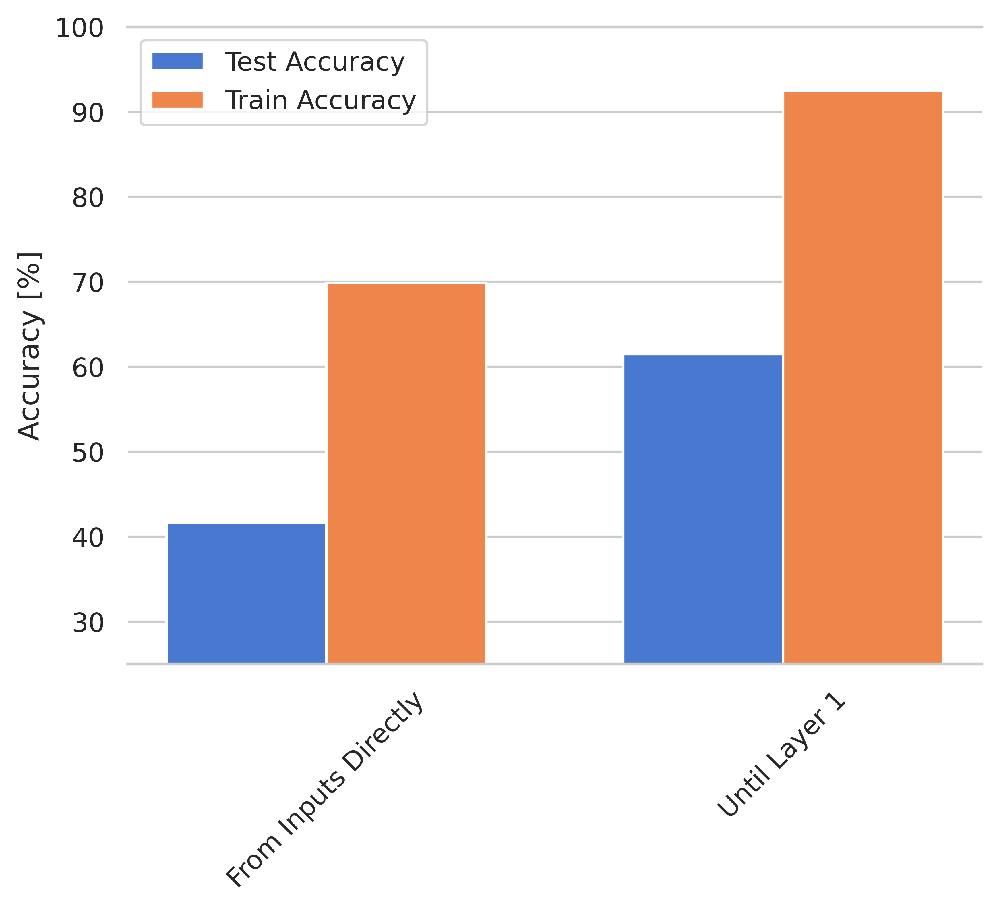

In [10]:
from utils import get_accuracy
if args.augment:
    test_acc, _ = get_accuracy(SNN, out_projs, test_loader, device, cat=cat)
    train_acc, _ = get_accuracy(SNN, out_projs, train_loader, device, cat=cat) 
else:
    test_acc = torch.mean(test_accs, dim=0)
    print(test_acc)
    train_acc = torch.mean(train_accs, dim=0)
# grouped Bar plot the Accuracies of the different layers both during training and testing
sns.set_theme(style="whitegrid")
labels = ['From Inputs Directly', *[f'Until Layer {i+1}' for i in range(len(SNN.layers))]]
if not cat:
    labels = ['From Inputs Directly', *[f'From Layer {i+1}' for i in range(len(SNN.layers))]]
x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars
fig, ax = plt.subplots()
rects1 = ax.bar(x - width/2, 100*torch.tensor(test_acc), width, label='Test Accuracy', color=color_list[0])
rects2 = ax.bar(x + width/2, 100*torch.tensor(train_acc), width, label='Train Accuracy', color=color_list[1])
if not args.augment:
    ax.errorbar(x - width/2, 100*test_acc, yerr=100*torch.std(test_accs, dim=0), fmt='none', capsize=6, color=color_list[3])
    ax.errorbar(x + width/2, 100*train_acc, yerr=100*torch.std(train_accs, dim=0), fmt='none', capsize=6, color=color_list[3])
# remove horizontal lines and spines
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.xaxis.grid(False)
plt.xticks(np.arange(len(out_projs)), labels, rotation=45)
plt.legend()
plt.ylabel('Accuracy [%]')
plt.ylim([25, 100])
#plt.title('SHD Accuracy');

# Few Shot Learning (discontinued)

In [ ]:
# Randomly select k sample of each class and save the spiking activity
n_outputs = 20
n_repeats = 1
k = 20
fewshot_accuracies = torch.zeros((n_repeats, len(SNN.layers)))
for n in range(n_repeats):
    SNN.reset(0)
    one_shot_samples = torch.zeros(n_outputs, n_time_bins, n_inputs)
    one_shot_spks = torch.zeros(n_outputs, len(SNN.layers), n_hidden[0])
    for i in trange(n_outputs):
        for j in range(k):
            img, _ = train_loader.next_item(i, contrastive=False)
            one_shot_samples[i] = img.squeeze()
            for t in range(n_time_bins):
                logits, mem_his, clapp_loss = SNN(img[t].float(), 0) 
                one_shot_spks[i] += torch.stack(logits).squeeze()

    def metric(spk, one_shot):
        dists = torch.zeros(spk.shape[0], args.n_outputs)
        for i in range(args.n_outputs):
            one_shot_i = one_shot[i] / one_shot[i].sum()
            dists[:, i] = torch.einsum('bi, i->b' , spk, one_shot_i)
        return dists

    def get_predictions(spks):
        preds = torch.zeros(len(spks), spks[0].shape[0])
        # for each layer get the prediction
        for i in range(len(spks)):
            dists = metric(spks[i], one_shot_spks[:,i])
            preds[i] = dists.argmax(axis=-1)
        return preds
    dataset = test_loader
    batch = int(len(dataset)/100)
    correct_oneshot = torch.zeros(len(SNN.layers))
    SNN.eval()
    pred_matrix_oneshot = torch.zeros(n_outputs, n_outputs)
    for idx in trange(0, len(dataset), batch):
        SNN.reset(0)
        inp, target = dataset.x[idx:idx+batch], dataset.y[idx:idx+batch]
        logits = torch.zeros(len(SNN.layers), inp.shape[0], n_hidden[0])
        for step in range(inp.shape[1]):
            data_step = inp[:,step].float().to(device)
            spk_step, _, _ = SNN(data_step, 0)
            logits += torch.stack(spk_step)
        preds = get_predictions(logits)
        for i in range(preds.shape[0]):
            correct_oneshot[i] += int((preds[i] == target).sum())
        # for the last layer create the prediction matrix
        for j in range(preds.shape[1]):
            pred_matrix_oneshot[int(target[j]), int(preds[-1, j])] += 1
    correct_oneshot /= len(dataset)
    for i in range(len(SNN.layers)):
        print(f'From layer {i+1}:')
        print(f'Accuracy: {100*correct_oneshot[i]:.2f}%')
        fewshot_accuracies[n, i] = correct_oneshot[i]
    plt.imshow(pred_matrix_oneshot, origin='lower')
    plt.title('Prediction Matrix for the final layer')
    plt.xlabel('Prediction')
    plt.ylabel('Target')
    plt.xticks([i for i in range(n_outputs)])
    plt.yticks([i for i in range(n_outputs)])
    plt.colorbar();
    plt.figure()

In [ ]:
# Boxplot of the accuracies
plt.figure()
sns.set_style("whitegrid")
g = sns.boxplot(data=fewshot_accuracies*100)
# remove left spines
sns.despine(left=True)
plt.xticks(np.arange(len(SNN.layers)), [f'Layer {i+1}' for i in range(len(SNN.layers))])
plt.ylabel('Few-Shot Test Accuracy [%]')
plt.ylim([0, 100])
print(f'Average Accuracy: {100*fewshot_accuracies.mean(axis=0)}%')
print(f'Maximum Accuracy: {fewshot_accuracies.max(axis=0)}%')